# Recurrent Neural Networks for Stock Price Prediction

* RNN
* LSTM
* GRU

In [28]:
!pip install pandas_market_calendars
# Import libraries.
import kagglehub
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pandas_market_calendars as mcal
import random
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchmetrics.functional import r2_score

In [29]:
seed = 42
np.random.seed(seed)

# Set seed for PyTorch.
torch.manual_seed(seed)

# Set seed for inbuilt random function.
random.seed(seed)

# Use Metal GPU.
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")

# Increase DPI for plots.
plt.rcParams['figure.dpi'] = 500

In [30]:
# Download and load the dataset
base_path = kagglehub.dataset_download("paultimothymooney/stock-market-data")
path = f"{base_path}/stock_market_data/forbes2000/csv/GOOG.csv"
df_ = pd.read_csv(path).drop(['Adjusted Close'], axis=1)
df = df_.iloc[:int(0.8 * df_.shape[0])]
df_test = df_.iloc[int(0.8 * df_.shape[0]):]

## Exploratory Data Analysis & Data Pre-processing

In [31]:
# Convert date to month/date/year format.
df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')
df_test['Date'] = pd.to_datetime(df_test['Date'], format='%d-%m-%Y')
df.head(n=15)

/tmp/ipykernel_24/462656788.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')
/tmp/ipykernel_24/462656788.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['Date'] = pd.to_datetime(df_test['Date'], format='%d-%m-%Y')


,Date,Low,Open,Volume,High,Close
0,2004-08-19,2.390042,2.490664,897427216,2.591785,2.499133
1,2004-08-20,2.503118,2.515820,458857488,2.716817,2.697639
2,2004-08-23,2.716070,2.758411,366857939,2.826406,2.724787
3,2004-08-24,2.579581,2.770615,306396159,2.779581,2.611960
4,2004-08-25,2.587302,2.614201,184645512,2.689918,2.640104
5,2004-08-26,2.606729,2.613952,142572401,2.688672,2.687676
6,2004-08-27,2.632383,2.692408,124826132,2.705360,2.643840
7,2004-08-30,2.540727,2.622171,104429967,2.627402,2.540727
8,2004-08-31,2.544463,2.547950,98825037,2.583068,2.549693
9,2004-09-01,2.482445,2.557912,183633734,2.564637,2.496891


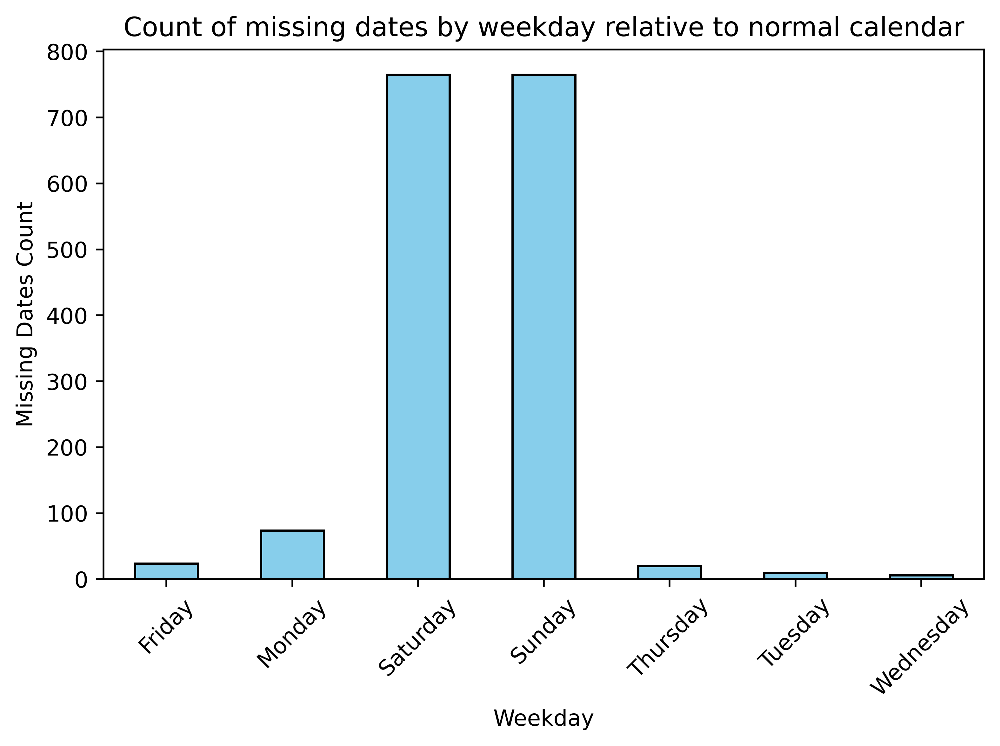

In [32]:
# Count the missing dates
full_date_range = pd.date_range(start=df['Date'].min(), end=df['Date'].max())
missing_dates = full_date_range.difference(df['Date'])
missing_dates_df = pd.DataFrame({'Date': missing_dates})
missing_dates_df['Weekday'] = missing_dates_df['Date'].dt.day_name()

# Count missing dates by weekday
weekday_counts = missing_dates_df['Weekday'].value_counts()

# Plot the counts in a bar chart
weekday_counts.sort_index(inplace=True)  # Sort by weekday order
weekday_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Count of missing dates by weekday relative to normal calendar')
plt.xlabel('Weekday')
plt.ylabel('Missing Dates Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [33]:
# Count the missing dates relative to the financial calendar.
nyse = mcal.get_calendar('NYSE')
schedule = nyse.schedule(start_date=df['Date'].min(), end_date=df['Date'].max())

# Generate a list of valid market days
valid_market_days = schedule.index

# Identify missing market days
missing_market_days = valid_market_days.difference(df['Date'])

# Convert to DataFrame for analysis
missing_days_df = pd.DataFrame({'Missing Dates': missing_market_days})
missing_days_df['Weekday'] = missing_days_df['Missing Dates'].dt.day_name()

# Output
print("Missing Market Days:")
print(missing_days_df)

Missing Market Days:
Empty DataFrame
Columns: [Missing Dates, Weekday]
Index: []


### Implication of missing dates
- When comparing the continuity of dates with the normal calendar, some dates are missing. However, it matches with the financial calendar.
- Some dates are missing since the financial market is closed on weekends and public holidays.
- These dates can be backfilled with data from previous dates.
- While predicting, additional checks are essential to account for market holidays.

In [34]:
# Backfill missing dates data.
# Set 'Date' as index
df.set_index('Date', inplace=True)

# Generate the complete date range
full_date_range = pd.date_range(start=df.index.min(), end=df.index.max())

# Reindex the DataFrame to include all dates
df = df.reindex(full_date_range)

# Backfill missing rows with the previous day's data
df = df.bfill()

# Reset the index and rename columns
df.reset_index(inplace=True)
df.rename(columns={'index': 'Date'}, inplace=True)


In [35]:
df_test.set_index('Date', inplace=True)

# Generate the complete date range
full_date_range = pd.date_range(start=df_test.index.min(), end=df_test.index.max())

# Reindex the DataFrame to include all dates
df_test = df_test.reindex(full_date_range)

# Backfill missing rows with the previous day's data
df_test = df_test.bfill()

# Reset the index and rename columns
df_test.reset_index(inplace=True)
df_test.rename(columns={'index': 'Date'}, inplace=True)

In [36]:
df.head(n=15)

,Date,Low,Open,Volume,High,Close
0,2004-08-19,2.390042,2.490664,897427216.0,2.591785,2.499133
1,2004-08-20,2.503118,2.515820,458857488.0,2.716817,2.697639
2,2004-08-21,2.716070,2.758411,366857939.0,2.826406,2.724787
3,2004-08-22,2.716070,2.758411,366857939.0,2.826406,2.724787
4,2004-08-23,2.716070,2.758411,366857939.0,2.826406,2.724787
5,2004-08-24,2.579581,2.770615,306396159.0,2.779581,2.611960
6,2004-08-25,2.587302,2.614201,184645512.0,2.689918,2.640104
7,2004-08-26,2.606729,2.613952,142572401.0,2.688672,2.687676
8,2004-08-27,2.632383,2.692408,124826132.0,2.705360,2.643840
9,2004-08-28,2.540727,2.622171,104429967.0,2.627402,2.540727


In [37]:
df.dtypes

Date      datetime64[ns]
Low              float64
Open             float64
Volume           float64
High             float64
Close            float64
dtype: object

In [38]:
df_test.dtypes

Date      datetime64[ns]
Low              float64
Open             float64
Volume           float64
High             float64
Close            float64
dtype: object

### Data type inference
- Need to convert Close and Volume columns to float data type for computation.

In [39]:
df.dtypes

Date      datetime64[ns]
Low              float64
Open             float64
Volume           float64
High             float64
Close            float64
dtype: object

In [40]:
df_test.dtypes

Date      datetime64[ns]
Low              float64
Open             float64
Volume           float64
High             float64
Close            float64
dtype: object

### Data visualisation

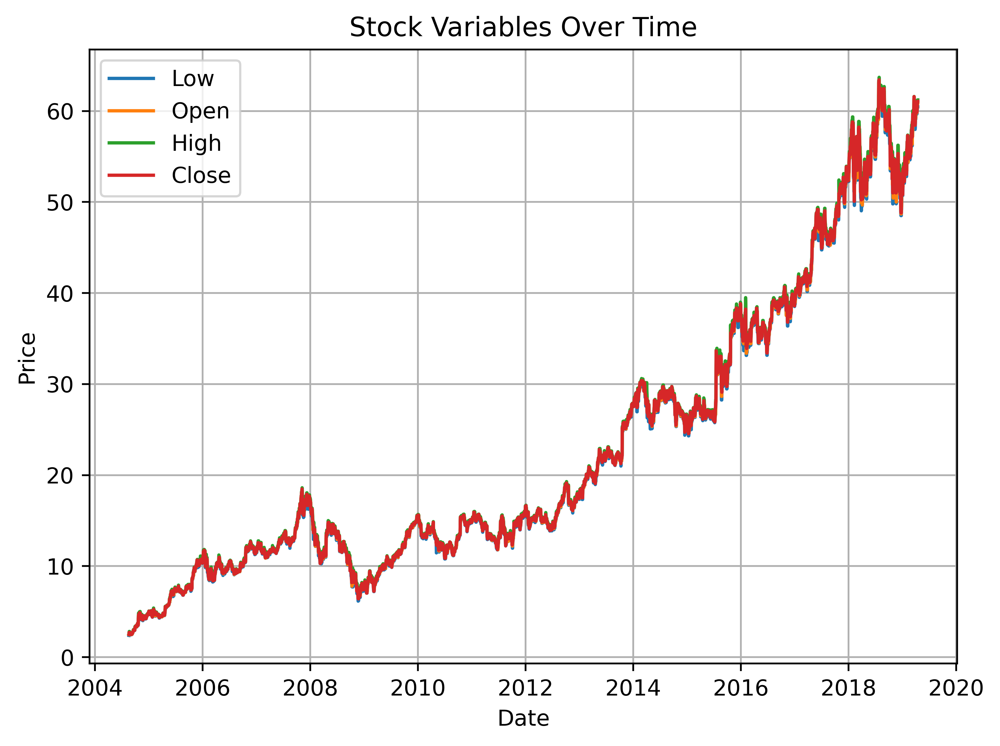

In [41]:
for column in df.drop(['Date', 'Volume'], axis=1).columns:
    plt.plot(df['Date'], df[column], label=column)

# Customize the plot
plt.title('Stock Variables Over Time')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend(loc='upper left')
plt.grid()
plt.tight_layout()

plt.show()

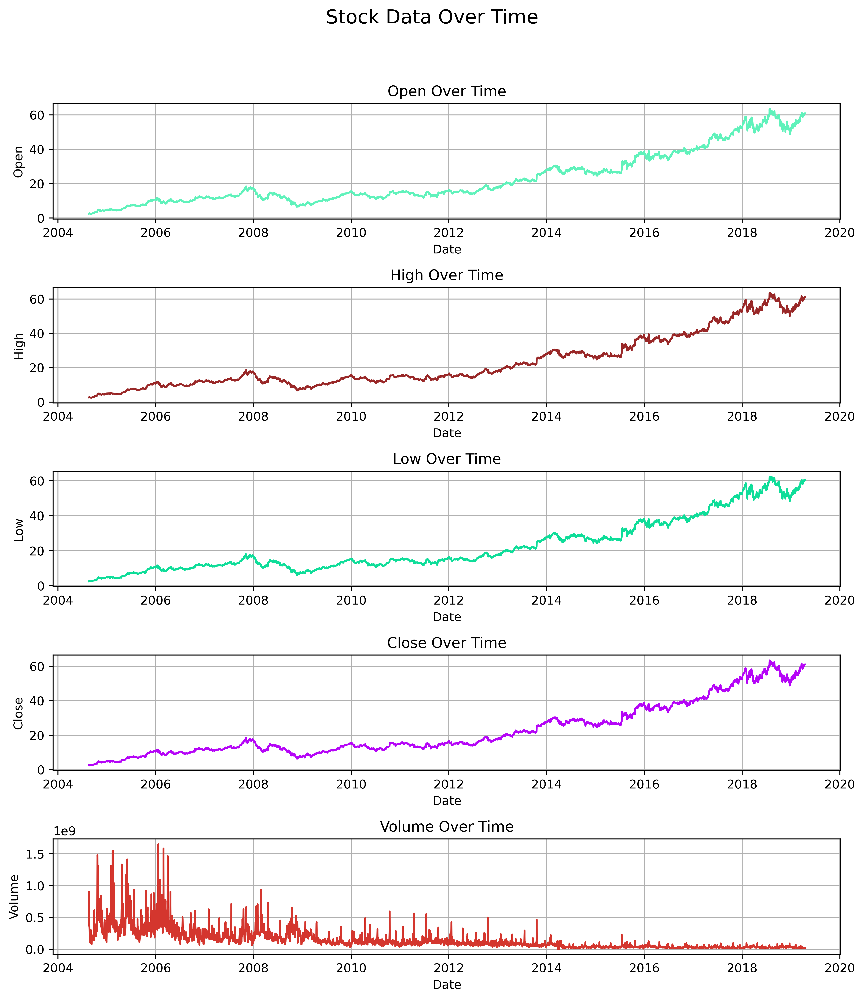

In [42]:
# Create subplots
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(10, 12), sharex=False)

# Plot each variable
variables = ['Open', 'High', 'Low', 'Close', 'Volume']
for i, var in enumerate(variables):
    axes[i].plot(df['Date'], df[var], label=var, color=np.random.rand(3,))
    axes[i].set_title(f'{var} Over Time')
    axes[i].set_ylabel(var)
    axes[i].grid(True)
    axes[i].set_xlabel('Date')

# Set common labels
fig.suptitle('Stock Data Over Time', fontsize=16)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

- Open, High, and Low variables have a similar pattern
- The pattern of the Close variable deviates around the year 2014.
- Volume variable has a fluctuating pattern.

### Data distribution

In [43]:
df.describe()

,Date,Low,Open,Volume,High,Close
count,5353,5353.000000,5353.000000,5.353000e+03,5353.000000,5353.000000
mean,2011-12-16 23:59:59.999999744,22.514393,22.734485,1.445564e+08,22.944555,22.735052
min,2004-08-19 00:00:00,2.390042,2.470490,1.584340e+05,2.534002,2.490913
25%,2008-04-18 00:00:00,11.572872,11.703632,3.886400e+07,11.814466,11.676235
50%,2011-12-17 00:00:00,15.296664,15.442866,9.196743e+07,15.560177,15.401770
75%,2015-08-16 00:00:00,30.971500,31.267000,1.868538e+08,31.641500,31.177999
max,2019-04-15 00:00:00,62.451000,63.549999,1.650833e+09,63.694500,63.416500
std,NaN,15.149213,15.272689,1.600150e+08,15.395013,15.279222


- The data need to be normalised for uniformity across all variables.
- The date variable cannot be used as is. It can be transformed to timestamp.

In [44]:
df['Timestamp'] = df['Date'].astype('int64') // 10**9
df_test['Timestamp'] = df_test['Date'].astype('int64') // 10**9

In [45]:
# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_df = scaler.fit_transform(df.drop('Date', axis=1).values)
scaled_df_test = scaler.transform(df_test.drop('Date', axis=1).values)

### Convert data to sequence

In [46]:
# Function to create dataset with time steps
def create_dataset(data, time_step=30):
    X, y = [], []
    for i in range(time_step, len(data)):
        X.append(data[i-time_step:i])
        y.append(data[i])
    return np.array(X), np.array(y)

# Create datasets
X_train, y_train = create_dataset(scaled_df)
X_test, y_test = create_dataset(scaled_df_test)

features = df.drop('Date', axis=1).columns

In [47]:
# Convert the data to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32)
X_test = torch.tensor(X_test, dtype=torch.float32)
y_test = torch.tensor(y_test, dtype=torch.float32)

## Modeling

In [48]:
# Model definitions
class RNNModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(RNNModel, self).__init__()
        self.rnn = nn.RNN(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)
    
    def forward(self, x):
        out, _ = self.rnn(x)
        out = self.fc(out[:, -1, :])
        return out

class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)
    
    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out[:, -1, :])
        return out

class GRUModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(GRUModel, self).__init__()
        self.gru = nn.GRU(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)
    
    def forward(self, x):
        out, _ = self.gru(x)
        out = self.fc(out[:, -1, :])
        return out


In [49]:
# Train and evaluate model with cross-validation
def train_model(model_class, model_name, params, X, y, n_splits=5):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
    results = []
    train_losses, val_losses = [], []
    best_models = []
    
    for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
        print(f"\nTraining {model_name} - Hidden Size: {params['hidden_size']}, "
              f"Num Layers: {params['num_layers']}, Learning Rate: {params['learning_rate']} - Fold {fold + 1}")

        train_X, val_X = X[train_idx], X[val_idx]
        train_y, val_y = y[train_idx], y[val_idx]

        model = model_class(input_size=len(features), hidden_size=params['hidden_size'], 
                            num_layers=params['num_layers'], output_size=len(features))
        criterion = nn.MSELoss()
        optimizer = optim.Adam(model.parameters(), lr=params['learning_rate'])

        best_val_loss = float('inf')
        early_stop_count = 0
        fold_train_loss, fold_val_loss = [], []

        for epoch in range(100):
            model.train()
            optimizer.zero_grad()
            output = model(train_X)
            loss = criterion(output, train_y)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            fold_train_loss.append(loss.item())

            model.eval()
            with torch.no_grad():
                val_output = model(val_X)
                val_loss = criterion(val_output, val_y).item()
                fold_val_loss.append(val_loss)

            # Print training progress
            if (epoch+1)%10==0:
                print(f"    Epoch {epoch+1}: Train Loss: {loss.item():.4f}, Val Loss: {val_loss:.4f}")

            # Early stopping and saving best model
            if val_loss < best_val_loss:
                best_val_loss = val_loss
                best_model_state = model.state_dict()  # Save the best model weights
                early_stop_count = 0
            else:
                early_stop_count += 1

            if early_stop_count > 10:
                print(f"    Early stopping at epoch {epoch+1}")
                break

        train_losses.append(fold_train_loss)
        val_losses.append(fold_val_loss)
        val_rmse = np.sqrt(best_val_loss)
        results.append({'Fold': fold + 1, 'Val_RMSE': val_rmse})
        best_models.append(best_model_state)

    return results, train_losses, val_losses, best_models


In [50]:
# Hyperparameter grid
hidden_sizes = [16, 32, 64]
num_layers_list = [1, 2, 3]
learning_rates = [0.01, 0.001, 0.0001]

# Store results
final_results = []

for model_class, model_name in zip([RNNModel, LSTMModel, GRUModel], ['RNN', 'LSTM', 'GRU']):
    for hidden_size in hidden_sizes:
        for num_layers in num_layers_list:
            for lr in learning_rates:
                params = {'hidden_size': hidden_size, 'num_layers': num_layers, 'learning_rate': lr}
                results, train_losses, val_losses, best_models = train_model(model_class, model_name, params, X_train, y_train)
                avg_rmse = np.mean([r['Val_RMSE'] for r in results])
                final_results.append({
                    'Model': model_name,
                    'Hidden_Size': hidden_size,
                    'Num_Layers': num_layers,
                    'Learning_Rate': lr,
                    'Avg_Val_RMSE': avg_rmse,
                    'Best_Models': best_models,
                    'Train_Loss': train_losses,
                    'Val_Loss': val_losses
                })

# Store results in a DataFrame
results_df = pd.DataFrame(final_results)


Training RNN - Hidden Size: 16, Num Layers: 1, Learning Rate: 0.01 - Fold 1
    Epoch 10: Train Loss: 0.0266, Val Loss: 0.0223
    Epoch 20: Train Loss: 0.0080, Val Loss: 0.0065
    Epoch 30: Train Loss: 0.0034, Val Loss: 0.0027
    Epoch 40: Train Loss: 0.0025, Val Loss: 0.0022
    Epoch 50: Train Loss: 0.0016, Val Loss: 0.0016
    Epoch 60: Train Loss: 0.0012, Val Loss: 0.0011
    Epoch 70: Train Loss: 0.0010, Val Loss: 0.0009
    Epoch 80: Train Loss: 0.0008, Val Loss: 0.0007
    Epoch 90: Train Loss: 0.0007, Val Loss: 0.0007
    Epoch 100: Train Loss: 0.0007, Val Loss: 0.0006

Training RNN - Hidden Size: 16, Num Layers: 1, Learning Rate: 0.01 - Fold 2
    Epoch 10: Train Loss: 0.0142, Val Loss: 0.0124
    Epoch 20: Train Loss: 0.0045, Val Loss: 0.0036
    Epoch 30: Train Loss: 0.0032, Val Loss: 0.0027
    Epoch 40: Train Loss: 0.0020, Val Loss: 0.0019
    Epoch 50: Train Loss: 0.0015, Val Loss: 0.0014
    Epoch 60: Train Loss: 0.0012, Val Loss: 0.0011
    Epoch 70: Train Loss: 0.0

In [51]:
results_df

,Model,Hidden_Size,Num_Layers,Learning_Rate,Avg_Val_RMSE,Best_Models,Train_Loss,Val_Loss
0,RNN,16,1,0.0100,0.025921,"[{'rnn.weight_ih_l0': [tensor([ 0.2093, 0.224...","[[0.23057419061660767, 0.16151031851768494, 0....","[[0.1588921844959259, 0.11038064956665039, 0.0..."
1,RNN,16,1,0.0010,0.092867,"[{'rnn.weight_ih_l0': [tensor([ 0.0585, -0.186...","[[0.18421229720115662, 0.17805986106395721, 0....","[[0.1759142130613327, 0.16995911300182343, 0.1..."
2,RNN,16,1,0.0001,0.357684,"[{'rnn.weight_ih_l0': [tensor([-0.0819, 0.083...","[[0.24967922270298004, 0.24863199889659882, 0....","[[0.24555133283138275, 0.2445194572210312, 0.2..."
3,RNN,16,2,0.0100,0.029171,"[{'rnn.weight_ih_l0': [tensor([ 0.0361, 0.013...","[[0.1731313318014145, 0.10430262982845306, 0.0...","[[0.10274158418178558, 0.06805050373077393, 0...."
4,RNN,16,2,0.0010,0.067604,"[{'rnn.weight_ih_l0': [tensor([ 0.0226, 0.106...","[[0.18267326056957245, 0.17442069947719574, 0....","[[0.17152388393878937, 0.16378098726272583, 0...."
...,...,...,...,...,...,...,...,...
76,GRU,64,2,0.0010,0.042399,"[{'gru.weight_ih_l0': [tensor([ 0.0540, -0.114...","[[0.13269241154193878, 0.11587026715278625, 0....","[[0.11423694342374802, 0.09897098690271378, 0...."
77,GRU,64,2,0.0001,0.155225,"[{'gru.weight_ih_l0': [tensor([ 0.1093, 0.101...","[[0.2255193442106247, 0.22300048172473907, 0.2...","[[0.21943458914756775, 0.21697813272476196, 0...."
78,GRU,64,3,0.0100,0.022785,"[{'gru.weight_ih_l0': [tensor([-0.0927, -0.160...","[[0.22666101157665253, 0.05350074917078018, 0....","[[0.05294071137905121, 0.33038130402565, 0.036..."
79,GRU,64,3,0.0010,0.044106,"[{'gru.weight_ih_l0': [tensor([ 0.0415, 0.041...","[[0.17559048533439636, 0.15447324514389038, 0....","[[0.15195892751216888, 0.13221193850040436, 0...."


## Testing

- Perform testing on Test data.

In [53]:
# Test each model and plot predictions
fig, axes = plt.subplots(len(features), 1, figsize=(20, 50), sharex=False, sharey=False)
intial_outs = X_test[0].reshape((1, *X_test[0].shape)).clone()
y_actual = torch.cat((intial_outs, torch.from_numpy(np.array([y_test]))), dim=1)
actual_prices = scaler.inverse_transform(y_actual[0].numpy())

final_results = []
for model_name, model_class in zip(['RNN', 'LSTM', 'GRU'], [RNNModel, LSTMModel, GRUModel]):
    # Filter the best parameters for this model
    model_results = results_df[results_df['Model'] == model_name]
    best_row = model_results.loc[model_results['Avg_Val_RMSE'].idxmin()]
    best_params = {
        'hidden_size': best_row['Hidden_Size'],
        'num_layers': best_row['Num_Layers'],
        'learning_rate': best_row['Learning_Rate']
    }
    best_weights = best_row['Best_Models'][0]  # Load the best model weights for the first fold
    
    # Initialize and load the model
    best_model = model_class(input_size=len(features), hidden_size=int(best_params['hidden_size']),
                             num_layers=int(best_params['num_layers']), output_size=len(features))
    best_model.load_state_dict(best_weights)
    
    # Evaluate on the test set
    best_model.eval()
    with torch.no_grad():
        test_output = best_model(X_test)
        test_output = torch.cat((intial_outs, torch.from_numpy(np.array([test_output]))), dim=1)
        predicted_prices = scaler.inverse_transform(test_output[0].numpy())
        
        
    
    # Calculate RMSE for test set
    criterion = nn.MSELoss()
    test_rmse = np.sqrt(criterion(test_output, y_actual).item())
    test_mae = torch.mean(np.abs(test_output-y_actual)).item()
    test_r2 = r2_score(test_output[0], y_actual[0]).item()
    print(f"Test RMSE for {model_name}: {test_rmse:.4f}")
    print(f"Test MAE for {model_name}: {test_mae:.4f}")
    print(f"Test R2 for {model_name}: {test_r2:.4f}")
    final_results.append({
        'Model': model_name,
        'Hidden size': best_row['Hidden_Size'],
        '#Layers': best_row['Num_Layers'],
        'Learning rate': best_row['Learning_Rate'],
        'Avg Val RMSE': best_row['Avg_Val_RMSE'],
        'Test RMSE': test_rmse,
        'Test MAE': test_mae,
        'Test R2': test_r2
    })
    # Plot the predictions
    for i in range(len(features)):
        axes[i].plot(df_test['Date'], predicted_prices[:, i], label=f'{model_name} Predictions (RMSE: {test_rmse:.4f})')
        if model_name == 'GRU':
            # Plot actual prices only on last plot
            axes[i].plot(df_test['Date'], actual_prices[:, i], label=f'Actual {features[i]}', color='blue', linewidth=2)
        axes[i].tick_params(axis='x', rotation=30)
        # Customize the plot
        axes[i].set_title(f'Test Data: Actual vs Predicted {features[i]} for RNN, LSTM, GRU')
        axes[i].set_xlabel('Date')
        axes[i].set_ylabel(f'{features[i]}')
        axes[i].legend()
        axes[i].grid()
plt.show()


Test RMSE for RNN: 0.3942
Test MAE for RNN: 0.2496
Test R2 for RNN: -5.2848
Test RMSE for LSTM: 0.4098
Test MAE for LSTM: 0.2618
Test R2 for LSTM: -3.1645
Test RMSE for GRU: 0.2958
Test MAE for GRU: 0.1816
Test R2 for GRU: -0.0383


## Evaluation

In [54]:
fr = pd.DataFrame(final_results)
fr

,Model,Hidden size,#Layers,Learning rate,Avg Val RMSE,Test RMSE,Test MAE,Test R2
0,RNN,32,2,0.01,0.023850,0.394200,0.249626,-5.284753
1,LSTM,32,1,0.01,0.029521,0.409752,0.261801,-3.164521
2,GRU,64,2,0.01,0.021872,0.295763,0.181649,-0.038331


In [55]:
def square_matrix(matrix):
    """
    Convert sparse matrix to dense matrix.
    """
    max_length = max(len(row) for row in matrix)
    
    # Pad each row by duplicating the last element until it matches max_length
    for row in matrix:
        row.extend([row[-1]] * (max_length - len(row)))
    
    return matrix

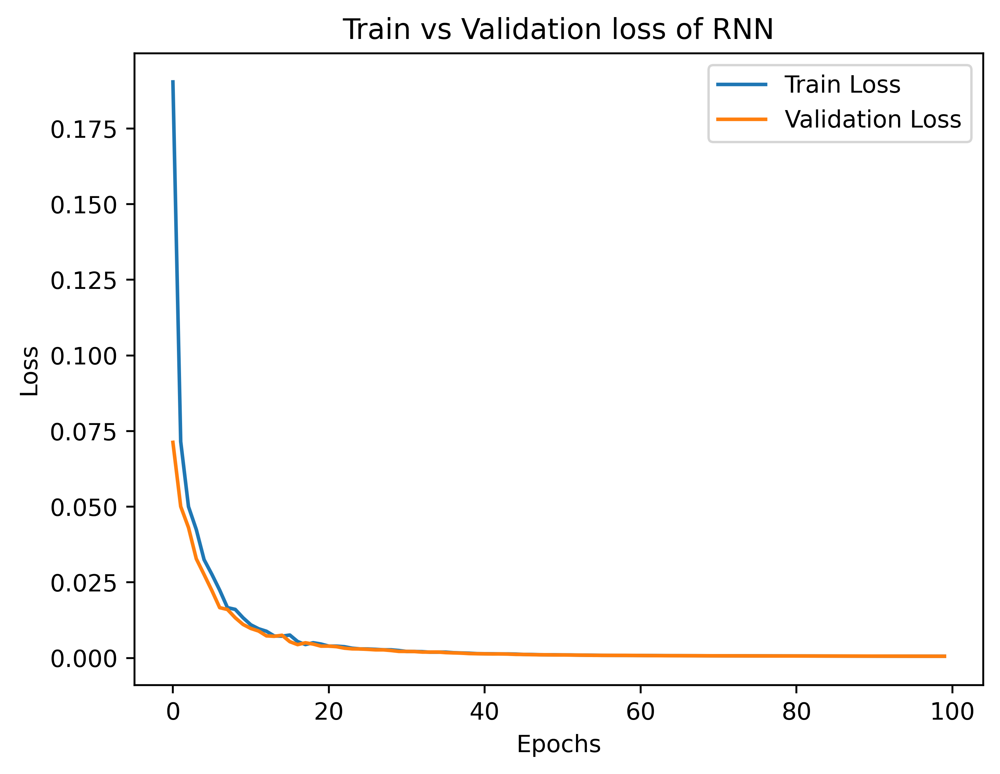

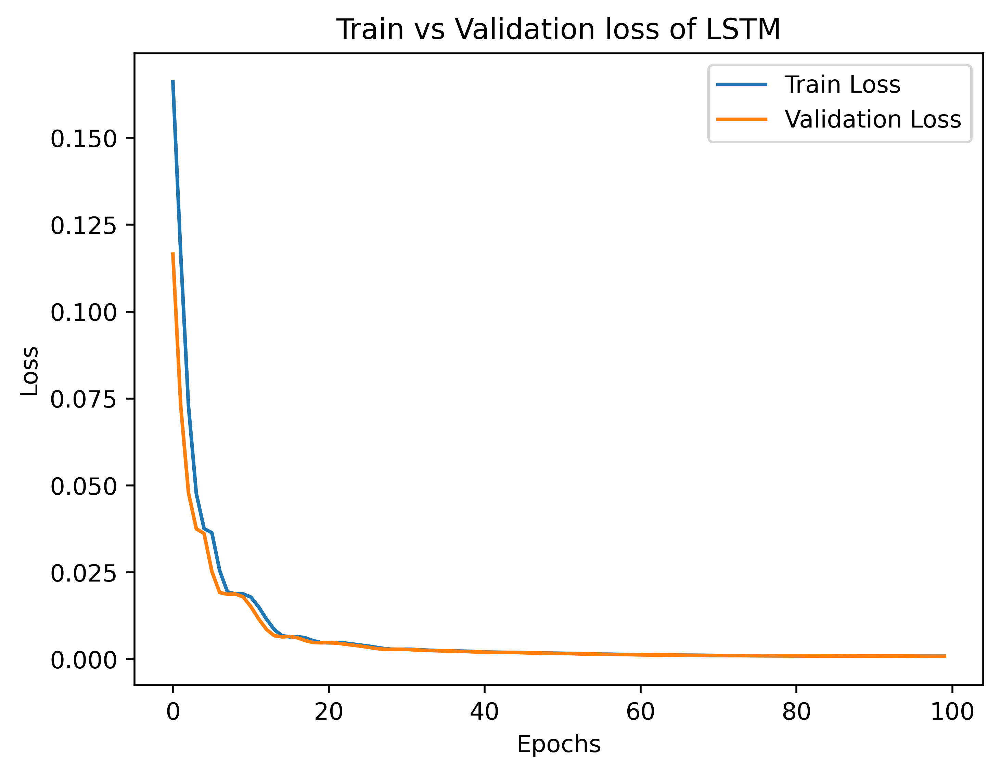

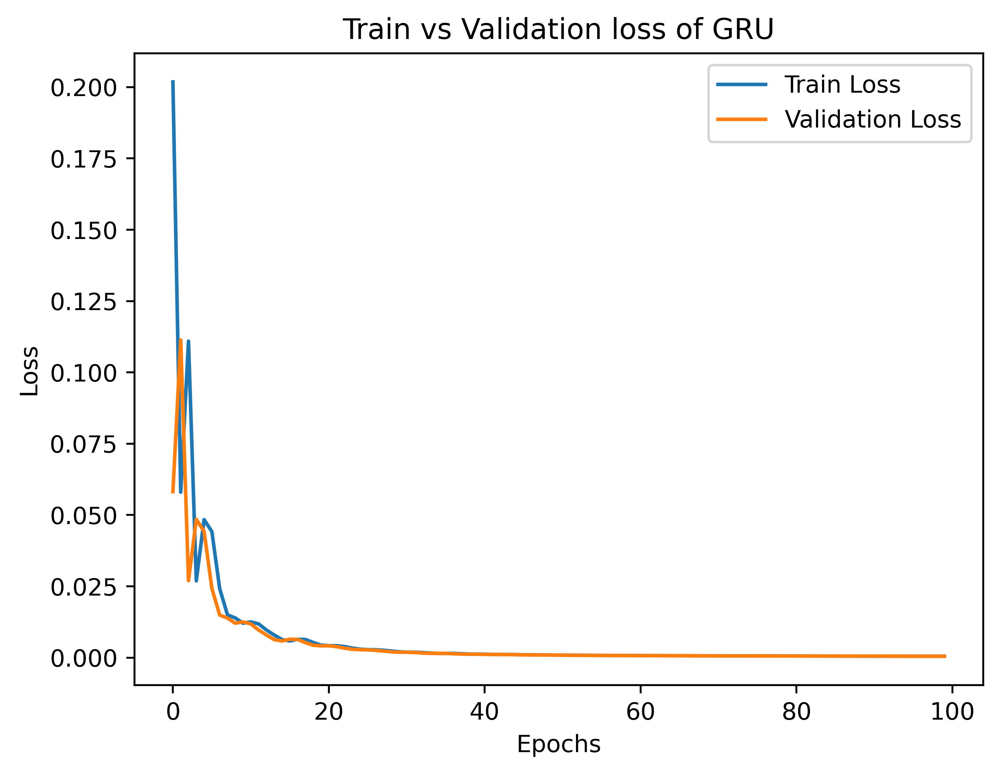

In [56]:
for model_name, model_class in zip(['RNN', 'LSTM', 'GRU'], [RNNModel, LSTMModel, GRUModel]):
    model_results = results_df[results_df['Model'] == model_name]
    best_row = model_results.loc[model_results['Avg_Val_RMSE'].idxmin()]
    train_loss = square_matrix(best_row['Train_Loss'])
    val_loss = square_matrix(best_row['Val_Loss'])
    train_loss = np.mean(train_loss, axis=0)
    val_loss = np.mean(val_loss, axis=0)
    epochs = range(train_loss.shape[0])
    plt.plot(epochs, train_loss, label="Train Loss")
    plt.plot(epochs, val_loss, label="Validation Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.title(f"Train vs Validation loss of {model_name}")
    plt.show()

### Autoregression

- Generate output one by one

In [57]:
def auto_regression(model, data, y):
    """
    Function for autoregressive output
    """
    initial_sequence = data[0].reshape((1, *data[0].shape)).clone()
    auto_out = initial_sequence.clone()
    actual_out = initial_sequence.clone()
    current_sequence = initial_sequence.clone()
    for i in range(len(y)):
        out = model(current_sequence)
        out = torch.tensor(torch.from_numpy(np.array([out])))
        auto_out = torch.cat((auto_out, out), dim=1)
        current_sequence = torch.cat((current_sequence[:, 1:, :], out), dim=1)
        actual_out = torch.cat((actual_out, torch.from_numpy(np.array([[y[i]]]))), dim=1)
    # Return predicted and actual outputs
    return auto_out[0], actual_out[0]
    

In [58]:
fig, axes = plt.subplots(len(features), 1, figsize=(20, 50), sharex=False, sharey=False)
actual_prices = scaler.inverse_transform(y_test.numpy())
final_results_auto = []
actual_output = None
for model_name, model_class in zip(['RNN', 'LSTM', 'GRU'], [RNNModel, LSTMModel, GRUModel]):
    # Filter the best parameters for this model
    model_results = results_df[results_df['Model'] == model_name]
    best_row = model_results.loc[model_results['Avg_Val_RMSE'].idxmin()]
    best_params = {
        'hidden_size': best_row['Hidden_Size'],
        'num_layers': best_row['Num_Layers'],
        'learning_rate': best_row['Learning_Rate']
    }
    best_weights = best_row['Best_Models'][0]  # Load the best model weights for the first fold
    
    # Initialize and load the model
    best_model = model_class(input_size=len(features), hidden_size=int(best_params['hidden_size']),
                             num_layers=int(best_params['num_layers']), output_size=len(features))
    best_model.load_state_dict(best_weights)
    
    # Evaluate on the test set
    
    best_model.eval()
    with torch.no_grad():
        # Autoregression
        test_output, actual_output = auto_regression(best_model, X_test, y_test)
        predicted_prices = scaler.inverse_transform(test_output.numpy())
        actual_prices = scaler.inverse_transform(actual_output.numpy())
    
    # Calculate RMSE for test set
    criterion = nn.MSELoss()
    test_rmse = np.sqrt(criterion(test_output, actual_output).item())
    test_mae = torch.mean(np.abs(test_output-actual_output)).item()
    test_r2 = r2_score(test_output, actual_output).item()
    print(f"Test RMSE for {model_name}: {test_rmse:.4f}")
    print(f"Test MAE for {model_name}: {test_mae:.4f}")
    print(f"Test R2 for {model_name}: {test_r2:.4f}")
    final_results_auto.append({
        'Model': model_name,
        'Hidden size': best_row['Hidden_Size'],
        '#Layers': best_row['Num_Layers'],
        'Learning rate': best_row['Learning_Rate'],
        'Avg Val RMSE': best_row['Avg_Val_RMSE'],
        'Autoregressive Test RMSE': test_rmse,
        'Autoregressive Test MAE': test_mae,
        'Autoregressive Test R2': test_r2
    })
    # Plot the predictions
    for i in range(len(features)):
        axes[i].plot(df_test['Date'], predicted_prices[:, i], label=f'{model_name} Predictions (RMSE: {test_rmse:.4f})')
        
    
        # Plot actual prices
        if model_name == 'GRU': # Show actual values on the last plot
            axes[i].plot(df_test['Date'], actual_prices[:, i], label=f'Actual {features[i]}', color='blue', linewidth=2)
        
        # Customize the plot
        axes[i].set_title(f'Test Data: Actual vs Predicted {features[i]} for RNN, LSTM, GRU via Autoregression')
        axes[i].set_xlabel('Date')
        axes[i].tick_params(axis='x', rotation=30)
        axes[i].set_ylabel(f'{features[i]}')
        axes[i].legend()
        axes[i].grid()
plt.show()


/tmp/ipykernel_24/1607493209.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  out = torch.tensor(torch.from_numpy(np.array([out])))


Test RMSE for RNN: 0.7085
Test MAE for RNN: 0.5037
Test R2 for RNN: -2.6996


/tmp/ipykernel_24/1607493209.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  out = torch.tensor(torch.from_numpy(np.array([out])))


Test RMSE for LSTM: 0.6735
Test MAE for LSTM: 0.4680
Test R2 for LSTM: -2.2414


/tmp/ipykernel_24/1607493209.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  out = torch.tensor(torch.from_numpy(np.array([out])))


Test RMSE for GRU: 0.7091
Test MAE for GRU: 0.5022
Test R2 for GRU: -2.5499


In [59]:
fr_auto = pd.DataFrame(final_results_auto)
fr_auto

,Model,Hidden size,#Layers,Learning rate,Avg Val RMSE,Autoregressive Test RMSE,Autoregressive Test MAE,Autoregressive Test R2
0,RNN,32,2,0.01,0.023850,0.708461,0.503704,-2.699573
1,LSTM,32,1,0.01,0.029521,0.673514,0.468020,-2.241434
2,GRU,64,2,0.01,0.021872,0.709135,0.502238,-2.549892
